# Data Analytics: Skills Stretch Workbook

The goal of this notebook is to practice my data cleaning, analysis, and visualization skills with a mix of PostgreSQL and Python. I want to clean and analyze the datasets with PostgreSQL and then use Python's Plotly package for visualization. 

Here are the steps of completion:
1. Populate pgAdmin database with tables for each of the relevant csv files from the FitBit data set here on Kaggle
2. Organize data into three new tables (daily_master, hourly_master, and minute_master)
3. Clean master tables 
4. Analyze master tables using PostgreSQL 
5. Visualize interesting findings by making a Plotly Dashboard
6. Summary

## 1. Populating pgAdmin Tables

To make my life easier I will loop through each of the csv files, print out column types and then load that into an AI (either ChatGPT or Claude AI) to help me create the 29 table quiries in my pgAdmin database.

In [ ]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

data = []
import os
for dirname, _, filenames in os.walk('/kaggle/input/fitbit'):
    for filename in filenames:
        # print(os.path.join(dirname, filename))
        data.append(os.path.join(dirname, filename))


# COMMENTING THIS OUT NOW THAT I HAVE WHAT I NEED
# for file in data:
#     df = pd.read_csv(file)
#     clean_name_pt_1 = file.replace('/kaggle/input/fitbit/', '')
#     if 'mturkfitbit_export_4.12.16-5.12.16/' in clean_name_pt_1:
#         clean_name_pt2 = clean_name_pt_1.replace('mturkfitbit_export_4.12.16-5.12.16/', '')
#     else:
#         clean_name_pt2 = clean_name_pt_1.replace('mturkfitbit_export_3.12.16-4.11.16/', '')
#     print(clean_name_pt2)
#     print(df.dtypes)
#     print('\n')

# Commented out code above use: was just 

## 2. Organizing data into three new tables (daily_master, hourly_master, and minute_master)

The "FitBit Fitness Tracker Data" notebook here on Kaggle had 29 different csv files across the two folders available. I wanted to combine as many of these files together for the analysis and visualization parts later. This step aims to do just that. 

#### Creating a Daily Master
```sql
CREATE TABLE daily_master AS
SELECT 
    ds.id,
    ds.activityday,
    ds.steptotal,
    dc.calories,
    di.sedentaryminutes,
    di.lightlyactiveminutes,
    di.fairlyactiveminutes,
    di.veryactiveminutes,
    di.sedentaryactivedistance,
    di.lightactivedistance,
    di.moderatelyactivedistance,
    di.veryactivedistance
FROM daily_steps_merged AS ds
JOIN daily_calories_merged AS dc 
  ON ds.id = dc.id AND ds.activityday = dc.activityday
JOIN daily_intensities_merged AS di 
  ON ds.id = di.id AND ds.activityday = di.activityday;
ALTER TABLE daily_master ADD PRIMARY KEY (id, activityday);

#### Creating a Hourly Master Table
```sql
CREATE TABLE hourly_master AS
SELECT 
    hs.id,
    hs.activityhour,
    hs.steptotal,
    hc.calories,
    hi.totalintensity,
    hi.averageintensity
FROM hourly_steps_merged AS hs
JOIN hourly_calories_merged AS hc 
    ON hs.id = hc.id AND hs.activityhour = hc.activityhour
JOIN hourly_intensities_merged AS hi 
    ON hs.id = hi.id AND hs.activityhour = hi.activityhour;
ALTER TABLE hourly_master
ADD PRIMARY KEY (id, activityhour);

#### Creating a Minute Master Table
```sql
CREATE TABLE minute_master AS
SELECT 
    ms.id,
    ms.activityminute,
    ms.steps,
    mc.calories,
    mi.intensity
FROM minute_steps_narrow_merged AS ms
JOIN minute_calories_narrow_merged AS mc 
    ON ms.id = mc.id AND ms.activityminute = mc.activityminute
JOIN minute_intensities_narrow_merged AS mi 
    ON ms.id = mi.id AND ms.activityminute = mi.activityminute;
ALTER TABLE minute_master ADD PRIMARY KEY (id, activityminute);

## 3. Clean Master Tables 
1. Deal with Duplicates 
2. Deal with null values
3. Populate missing rows
4. Drop any unecessary columns
5. Feature engineering and or split columns

(For this step I'm only doing the daily_master table)

#### 1. Deal with Duplicate Values
```sql
SELECT  COUNT(*) as count, 
		id,
		activityday
from daily_master
group by id, activityday
HAVING count(*) > 1;

-- No duplicates

#### 2. Deal with Null Values
```sql
SELECT  COUNT(*) FILTER (WHERE activityday IS NULL) as null_day,
		COUNT(*) FILTER (WHERE steptotal IS NULL) as null_step,
		COUNT(*) FILTER (WHERE calories IS NULL) as null_calories,
		COUNT(*) FILTER (WHERE sedentaryminutes IS NULL) as null_sed_minutes,
		COUNT(*) FILTER (WHERE lightlyactiveminutes IS NULL) as null_lightly_act_minutes,
		COUNT(*) FILTER (WHERE veryactiveminutes IS NULL) as null_active_minutes,
		COUNT(*) FILTER (WHERE sedentaryactivedistance IS NULL) as null_sed_act_dist,
		COUNT(*) FILTER (WHERE lightactivedistance IS NULL) as null_light_distance,
		COUNT(*) FILTER (WHERE moderatelyactivedistance IS NULL) as null_mod_distance,
		COUNT(*) FILTER (WHERE veryactivedistance IS NULL) as null_act_distance
FROM daily_master

-- No Null Values

#### 3. Populate Missing Rows
```sql
WITH avg_sub_table AS (
SELECT
	id,
 	AVG(steptotal) FILTER (WHERE steptotal != 0) OVER (PARTITION BY id) AS avg_steptotal,
    AVG(calories) FILTER (WHERE calories != 0) OVER (PARTITION BY id) AS avg_calories,
    AVG(sedentaryminutes) FILTER (WHERE sedentaryminutes != 0) OVER (PARTITION BY id) AS avg_sedentary_minutes,
    AVG(lightlyactiveminutes) FILTER (WHERE lightlyactiveminutes != 0) OVER (PARTITION BY id) AS avg_lightly_active_minutes,
    AVG(fairlyactiveminutes) FILTER (WHERE fairlyactiveminutes != 0) OVER (PARTITION BY id) AS avg_fairly_active_minutes,
    AVG(veryactiveminutes) FILTER (WHERE veryactiveminutes != 0) OVER (PARTITION BY id) AS avg_very_active_minutes,
    AVG(sedentaryactivedistance) FILTER (WHERE sedentaryactivedistance != 0) OVER (PARTITION BY id) AS avg_sedentary_active_distance,
    AVG(lightactivedistance) FILTER (WHERE lightactivedistance != 0) OVER (PARTITION BY id) AS avg_light_active_distance,
    AVG(moderatelyactivedistance) FILTER (WHERE moderatelyactivedistance != 0) OVER (PARTITION BY id) AS avg_moderate_active_distance,
    AVG(veryactivedistance) FILTER (WHERE veryactivedistance != 0) OVER (PARTITION BY id) AS avg_very_active_distance,
    AVG(lightly_active_speed) FILTER (WHERE lightly_active_speed != 0) OVER (PARTITION BY id) AS avg_lightly_active_speed,
    AVG(moderately_active_speed) FILTER (WHERE moderately_active_speed != 0) OVER (PARTITION BY id) AS avg_moderately_active_speed,
    AVG(very_active_speed) FILTER (WHERE very_active_speed != 0) OVER (PARTITION BY id) AS avg_very_active_speed
FROM daily_master
ORDER BY id
)
UPDATE daily_master 
SET 
	steptotal = avg.avg_steptotal,
	calories = avg.avg_calories,
    sedentaryminutes = avg.avg_sedentary_minutes,
    lightlyactiveminutes = avg.avg_lightly_active_minutes,
    fairlyactiveminutes = avg.avg_fairly_active_minutes,
    veryactiveminutes = avg.avg_very_active_minutes,
    sedentaryactivedistance = avg.avg_sedentary_active_distance,
    lightactivedistance = avg.avg_light_active_distance,
    moderatelyactivedistance = avg.avg_moderate_active_distance,
    veryactivedistance = avg.avg_very_active_distance,
    lightly_active_speed = avg.avg_lightly_active_speed,
    moderately_active_speed = avg.avg_moderately_active_speed,
    very_active_speed = avg.avg_very_active_speed
FROM avg_sub_table avg
WHERE daily_master.id = avg.id
	  AND steptotal = 0

-- There were 77 rows with 0 steps total (which what I'm considering a missing row value) out of 940 total rows. That is about 8.2% of rows have missing values. This is an acceptable amount and the query above replaces these missing rows with the average column values of the associated user

#### 4. Drop Unwanted Columns
```sql
--Checking
select * 
from daily_master

-- None to drop


#### 5. Feature Engineering
**5.1 Three Speed Columns**
```sql
-- Creating three speed columns 
ALTER TABLE daily_master
ADD COLUMN lightly_active_speed FLOAT,
ADD COLUMN moderately_active_speed FLOAT,
ADD COLUMN very_active_speed FLOAT

-- Going to assume this is in KM not Miles so KM/H will be:
UPDATE daily_master
SET lightly_active_speed =
	CASE 
		WHEN lightlyactiveminutes > 0 THEN (lightactivedistance / lightlyactiveminutes) * 60 ELSE 0 
	END,
	moderately_active_speed = 
	CASE 	
		WHEN fairlyactiveminutes > 0 THEN (moderatelyactivedistance / fairlyactiveminutes) * 60 ELSE 0
	END,
	very_active_speed = 
    CASE 
        WHEN veryactiveminutes > 0 THEN (veryactivedistance / veryactiveminutes) * 60 ELSE 0
    END;

-- These don't really seem entirely helpful to be honest but since this is just to test my skills it is alright.

**5.2 Name columns for the three master tables (for later when I make a dashboard)**
```sql
-- Creating a user_lookup table
CREATE TABLE user_lookup (
  id BIGINT PRIMARY KEY,
  name TEXT
);
-- Populating the table with made up names
INSERT INTO user_lookup (id, name) VALUES
  (4558609924, 'Phillip G'),
  (2320127002, 'Samantha T'),
  (1624580081, 'Jordan B'),
  (4319703577, 'Emily R'),
  (4445114986, 'David K'),
  (2026352035, 'Sophia W'),
  (5577150313, 'Ethan H'),
  (1927972279, 'Olivia L'),
  (1844505072, 'Liam P'),
  (5553957443, 'Ava M'),
  (6775888955, 'Noah S'),
  (6117666160, 'Isabella V'),
  (2347167796, 'Mason D'),
  (8053475328, 'Mia J'),
  (1503960366, 'James C'),
  (4388161847, 'Amelia F'),
  (8792009665, 'Logan Z'),
  (4057192912, 'Harper Y'),
  (4020332650, 'Lucas Q'),
  (8253242879, 'Evelyn B'),
  (7086361926, 'Alexander U'),
  (8378563200, 'Charlotte N'),
  (3372868164, 'Benjamin I'),
  (3977333714, 'Abigail O'),
  (6962181067, 'Elijah X'),
  (7007744171, 'Ella T'),
  (8877689391, 'William R'),
  (1644430081, 'Grace K'),
  (4702921684, 'Henry S'),
  (6290855005, 'Avery M'),
  (2022484408, 'Jack L'),
  (2873212765, 'Scarlett P'),
  (8583815059, 'Daniel W');

-- Creating new columns 
ALTER TABLE daily_master ADD COLUMN name TEXT;
ALTER TABLE hourly_master ADD COLUMN name TEXT;
ALTER TABLE minute_master ADD COLUMN name TEXT;

-- Updating master tables
-- For daily_master
UPDATE daily_master
SET name = lookup.name
FROM user_lookup lookup
WHERE daily_master.id = lookup.id;
-- For hourly_master
UPDATE hourly_master
SET name = lookup.name
FROM user_lookup lookup
WHERE hourly_master.id = lookup.id;
-- For minute_master
UPDATE minute_master
SET name = lookup.name
FROM user_lookup lookup
WHERE minute_master.id = lookup.id;

## 4. Analyze master tables using PostgreSQL 

Goals of this section will be to practice analytics using PostgreSQL. Here are the questions I will be aiming to answer for this practice:

1. For each user, what is the average daily step total and total calories burned?
2. Daily Goal Acheivment: for each user, what percentage of their days meet or exceed 10,000 steps?
3. For all users combined, which hour of day has the highest average step count?
4. For each user, what is the maximum continuous streak (in minutes) where their minute-level intensity is above 3?
5. For each user, in the hourly_master table, what is the longest block of consecutive hours where totalintensity > 30?
6. How many days does the user have at least one high-intensity hour? (total intensity > 60)
7. For each user in daily_master, what is the longest streak of consecutive days where steptotal > 10000?
8. For each user ID in weight_log_info, what is the biggest time gap in days between two weight log entries?
9. For each user, what was their longest consecutive streak of very active minutes? (active minutes > 30)

**1. For each user, what is the average daily step total and total calories burned?**
```sql
select 
	name,
	ROUND(AVG(steptotal), 2) as average_steps,
	ROUND(AVG(calories), 2) as average_calories_burned
from daily_master
GROUP BY 
	name
order by 
	name
```

**Insight:**  
✅ *Average daily steps range from ~1,670 to over 16,000 across users.*  
🏆 *William R stands out with the highest average daily steps and calories burned.*  
🔍 *Some users show high calorie burns despite moderate step counts, hinting at additional activities or workout intensity.*  


**2. Daily Goal Acheivment: for each user, what percentage of their days meet or exceed 10,000 steps?**
```sql
WITH counts AS (
select 
	name,
	SUM(CASE WHEN (steptotal > 10000) THEN 1 ELSE 0 END) as ten_k_days_count,
	count(*) as user_days_total_count
from 
	daily_master
group by
	name
)
select 
	name,
	ROUND((ten_k_days_count::NUMERIC / user_days_total_count::NUMERIC) * 100, 2) as user_percentage_10k_days
from counts
order by 
	user_percentage_10k_days desc
```
**Insight:**  
• Goal achievement ranges from 0% to 90%  
• William R and James C reach 10k steps ~90% of days  
• ~30% of users rarely hit the goal or never do  
• Shows big lifestyle differences among users


**3. For all users combined, which hour of day has the highest average step count?**
```sql
select 
	EXTRACT(hour from activityhour) as hour,
	AVG(steptotal) as avg_steps,
	AVG(calories) as avg_calories_burned,
	AVG(totalintensity) as avg_total_intensity
from hourly_master
group by
	hour
order by
	avg_steps desc
```
**Insight:**  
- 5–7 PM is the peak window for step activity.
- Midday shows moderate step counts.
- Early morning and late night step activity is minimal.
- This reflects typical daily routines: work, lunch break, and post-work exercise.


**4. For each user, what is the maximum continuous streak (in minutes) where their minute-level intensity is above 3?**
```sql
WITH flagged AS (
  SELECT 
    name,
    activityminute,
    intensity,
    -- mark if it's high
    CASE WHEN intensity >= 3 THEN 1 ELSE 0 END AS is_high
  FROM minute_master
),

numbered AS (
  SELECT
    name,
    activityminute,
    is_high,
    ROW_NUMBER() OVER (PARTITION BY name ORDER BY activityminute) AS rn1,
    ROW_NUMBER() OVER (PARTITION BY name, is_high ORDER BY activityminute) AS rn2
  FROM flagged
),

grouped AS (
  SELECT
    name,
    activityminute,
    is_high,
    rn1 - rn2 AS grp
  FROM numbered
  WHERE is_high = 1  -- only keep the high intensity blocks
),

streaks AS (
  SELECT
    name,
    grp,
    COUNT(*) AS streak_length
  FROM grouped
  GROUP BY name, grp
)

SELECT
  name,
  MAX(streak_length) AS max_streak_high_intensity
FROM streaks
GROUP BY name
ORDER BY max_streak_high_intensity DESC;
```

**Insight:**  
- Longest high-intensity streak: William R, 124 mins.
- Several users achieve 60–80 mins of continuous intensity.
- Majority stay below 50 mins.
- Suggests varied fitness endurance and workout styles.


**5. For each user, in the hourly_master table, what is the longest block of consecutive hours where totalintensity > 30?**
```sql
WITH 
flagger as (
	select 
		name, 
		activityhour,
		totalintensity,
		case when (totalintensity > 30) THEN 1 ELSE 0 END as high_intensity_hour
	from hourly_master
),
row_counts as (
	select 
		name,
		activityhour,
		high_intensity_hour,
		ROW_NUMBER() OVER (PARTITION BY name ORDER BY activityhour) as rn1,
		ROW_NUMBER() OVER (PARTITION BY name, high_intensity_hour ORDER BY activityhour) AS rn2
	from flagger
),
grouped_high_int_hour as (
	select 
		name, 
		activityhour,
		high_intensity_hour,
		rn1 - rn2 as grp
	from row_counts
	where 	
		high_intensity_hour = 1
),
high_intensity_streaks as (
	select 
		name,
		grp,
		count(*) as streak_length
	from grouped_high_int_hour
	group by
		name, grp
	order by
		name, grp
),
--get longest stretch of highly active hours for each person
max_streaks as (
select 
	name,
	MAX(streak_length) as max_streak_length
from high_intensity_streaks
group by 
	name
order by
	max_streak_length desc
)
select 
	g.name,
	g.activityhour,
	s.streak_length
from grouped_high_int_hour g
join high_intensity_streaks s on g.name = s.name and g.grp = s.grp
JOIN max_streaks m
  ON s.name = m.name AND s.streak_length = m.max_streak_length
ORDER BY g.name, g.activityhour;
```

**Insight:**  
- Some users maintain exceptionally long high-intensity periods: William R reached 19 consecutive high-intensity hours — nearly an entire waking day of active movement
- Multiple users show blocks of 10–15 consecutive active hours, highlighting periods of continuous physical effort.
- These extended blocks likely reflect full-day activities, sports events, or highly active occupations.


**6. How many days does the user have at least one high-intensity hour? (total intensity > 60)**
```sql
WITH user_high_int_days as (
select 
	name,
	DATE(activityhour) as day
from hourly_master
where totalintensity >= 60
group by
	name, day
order by 
	name, day
)
select 
	name,
	count(*) as num_days_with_high_int_hour
from user_high_int_days
group by 
	name
order by
	num_days_with_high_int_hour desc
```
**Insight:**  
- The majority of users achieved at least one high-intensity hour on multiple days.
- The most consistent users, like Jack L and Mia J, managed nearly a month of days with intense activity — demonstrating high dedication to sustained fitness habits.
- In contrast, the bottom group only reached this level on one or two days, suggesting significant variation in activity patterns across individuals.


**7. For each user in daily_master, what is the longest streak of consecutive days where steptotal > 10000?**
```sql
WITH flagger as (
	select 
		name,
		activityday,
		steptotal,
		case when steptotal >= 10000 then 1 else 0 end as high_step_day
	from daily_master
),
row_counts as (
	select 
		name,
		activityday, 
		high_step_day,
		ROW_NUMBER() OVER (PARTITION BY name ORDER BY activityday) as rn1,
		ROW_NUMBER() OVER (PARTITION BY name, high_step_day ORDER BY activityday) as rn2
	from flagger
),
grouped as (
	select 
		name, 
		activityday, 
		rn1 - rn2 as grp
	from row_counts
	where 
		high_step_day = 1
),
streaks as (
	select 
		name,
		grp, 
		count(grp) as ten_k_streak,
		MIN(activityday) AS streak_start,
	    MAX(activityday) AS streak_end
	from 
		grouped
	group by
		name, 
		grp
),
ranked AS (
  SELECT
    name,
    ten_k_streak,
    streak_start,
    streak_end,
    ROW_NUMBER() OVER (PARTITION BY name ORDER BY ten_k_streak DESC) AS rn
  FROM streaks
)
SELECT 
  name,
  ten_k_streak AS longest_10k_streak,
  streak_start,
  streak_end
FROM ranked
WHERE rn = 1
ORDER BY longest_10k_streak DESC;
```

**Insight:**  
- This analysis reveals clear differences in commitment to daily movement.  
- Some users, like James C, showed remarkable consistency, achieving 10,000+ steps daily for up to 21 days in a row.
- Many others had much shorter streaks, hinting at inconsistent routines or sporadic bursts of activity.
- These patterns could inform personalized health coaching: high performers might be encouraged to maintain their habits, while low-consistency users could benefit from motivational nudges or reminders.


**8. For each user ID in weight_log_info, what is the biggest time gap in days between two weight log entries?**
```sql
WITH dates as (
select 
	id,
	date,
	weightpounds,
	LAG(date) OVER (PARTITION BY id ORDER BY date) as prev_date
from weight_log_info_merged
),
no_weigh_in_streaks as (
select 
	id,
	(date - prev_date) as last_weigh_in,
	weightpounds
from dates
)
select 
	id, 
	COALESCE(MAX(last_weigh_in), 0) as max_gap_days
from no_weigh_in_streaks
group by
	id
order by
	max_gap_days desc
```
**Insight:**  
- Some users (e.g., 2873212765) had large gaps of 17–21 days — suggesting sporadic or forgotten check-ins.
- Others (like 1503960366) had short gaps — indicating more regular weight logging.
- A few have zero gap because they only logged weight once — so technically, there’s no “gap” to measure.
- Only 8 of the 33 users appear in this weight log table — and only 2 of those users recorded more than 17 entries.


**9. For each user, what was their longest consecutive streak of very active minutes each day? (active minutes > 30)**
```sql
WITH flagger as (
	select 
		name,
		activityday,
		veryactiveminutes, 
		CASE WHEN veryactiveminutes >= 30 THEN 1 ELSE 0 END as intense_workout_day
	from daily_master
),
row_counts as (
	select
		name, 
		activityday,
		veryactiveminutes,
		intense_workout_day,
		row_number() OVER (PARTITION BY name ORDER BY activityday) as rn1,
		row_number() OVER (PARTITION BY name, intense_workout_day ORDER BY activityday) as rn2
	from 
		flagger
),
grouped as (
	select 
		name,
		activityday,
		rn1 - rn2 as grp
	from row_counts
	where 
		intense_workout_day = 1
),
streaks as (
	select 
		name,
		grp,
		count(*) as very_active_workout_streak,
		MIN(activityday) as start_date,
		MAX(activityday) as end_date
	from grouped
	group by 
		name, grp
),
ranked as (
select 
	name,
	very_active_workout_streak,
	RANK() OVER(PARTITION BY name ORDER BY very_active_workout_streak desc) as rk,
	start_date,
	end_date
from streaks
ORDER BY
	name
)
select 
	name,
	COALESCE(very_active_workout_streak, 0) as longest_very_active_workout_streak,
	start_date,
	end_date
from ranked
where 
	rk = 1
ORDER by
	longest_very_active_workout_streak desc,
	name
```
**Insight:**

- Mia J stands out with the longest sustained streak of 18 days with very active minutes above 30 — suggesting consistent, high-intensity workouts over more than two weeks.
- Ethan H, James C, and William R also show notably long streaks (7–10 days) of maintaining very active minutes daily, implying a strong commitment to vigorous exercise.
- Many other users have shorter or fragmented streaks (1–5 days), revealing more sporadic intense activity periods.
- A few users, like Ava M, display multiple short streaks at different times, which could mean bursts of motivation or varying routine schedules

## 5. Visualization

Goal:
Build a Python-powered dashboard with four tabs: User Overview, Daily Master, Hourly Master, and Minute Master. Each tab will have interactive controls/graph selections built from one or more of the three master tables. Users will be able to explore trends and drill down into the data using metric, chart type, and user controls. Here are screen shots of the dashboard and each of its tabs below:


### 👤 User Overview Tab

1️⃣ **Radial Chart**
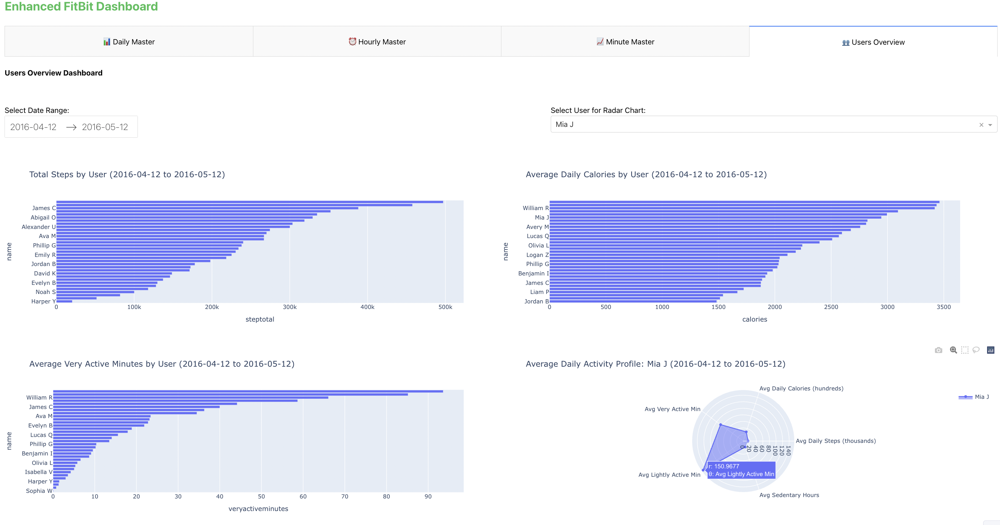

2️⃣ **Date Slider Plot**
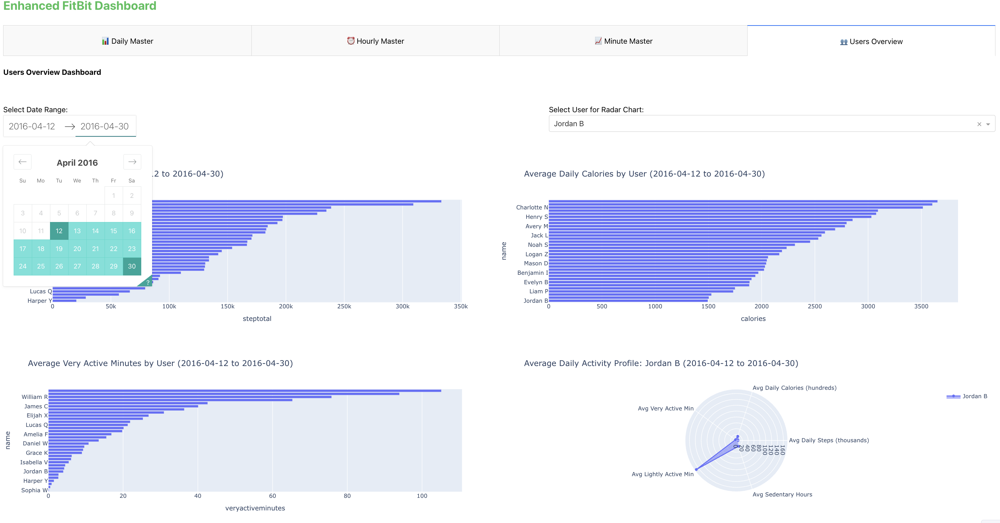

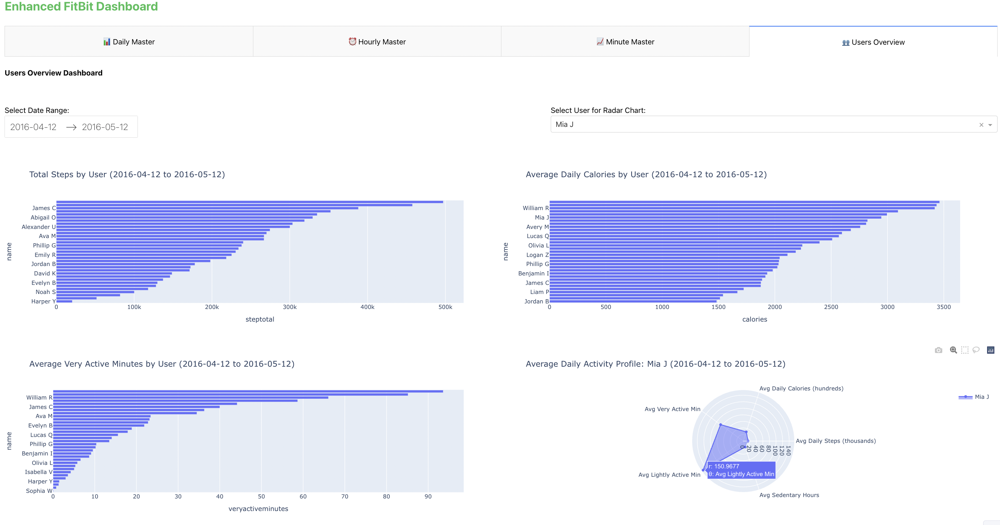
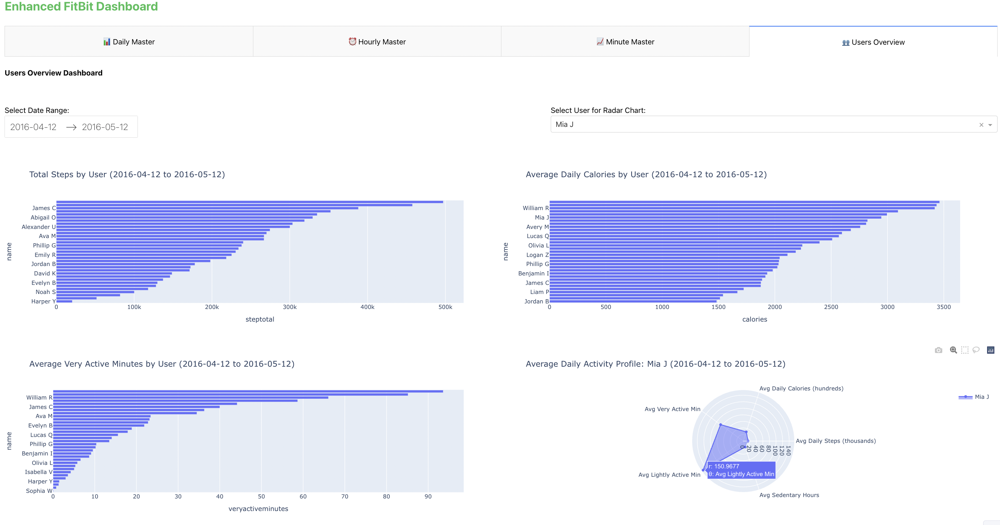

### 📊 Daily Master Tab

1️⃣ **Histogram** 
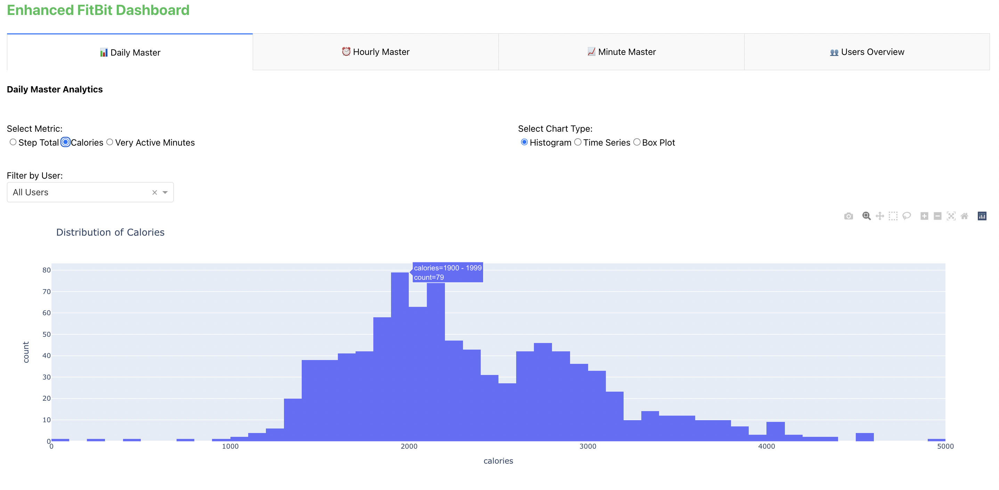

2️⃣ **Time Series**  
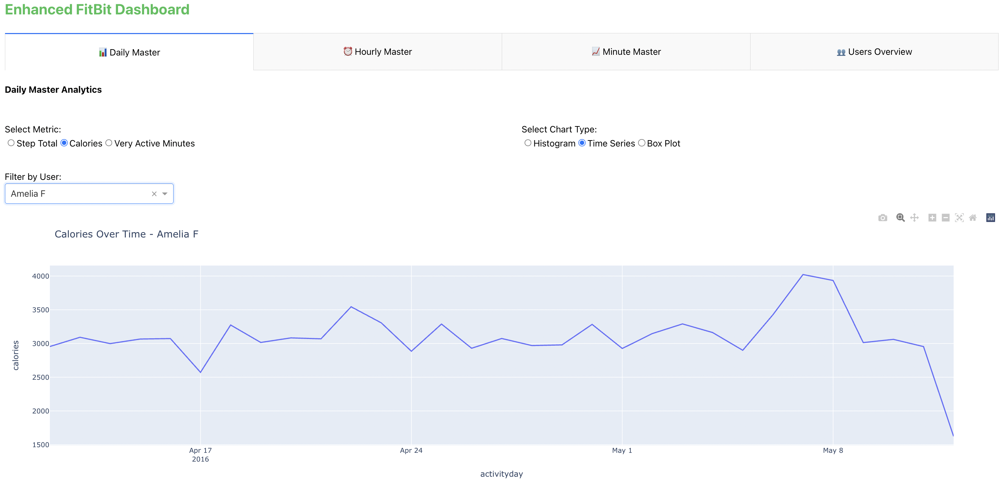

3️⃣ **Boxplot**  
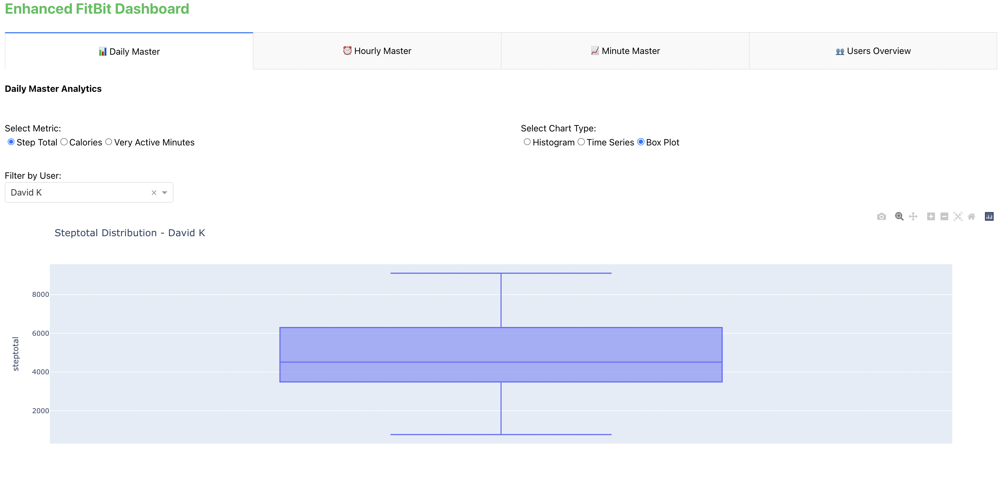

### ⏰ Hourly Master Tab

1️⃣ **Heatmap**
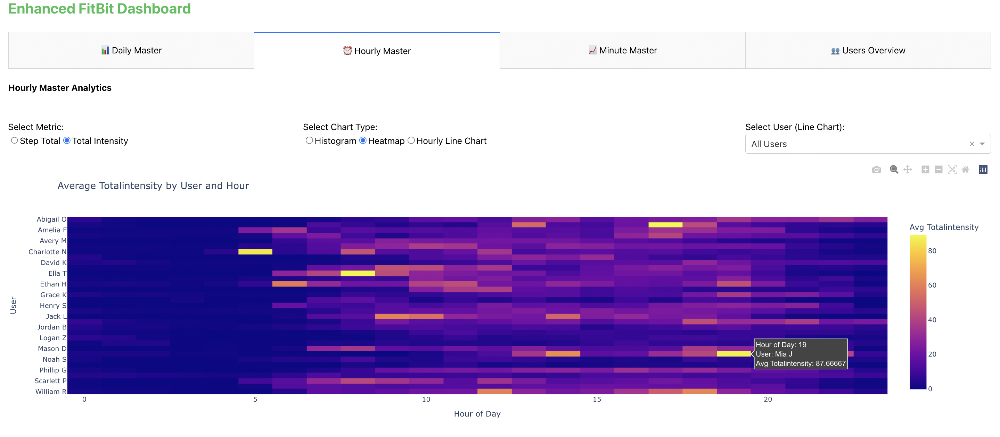
2️⃣ **Line Chart**
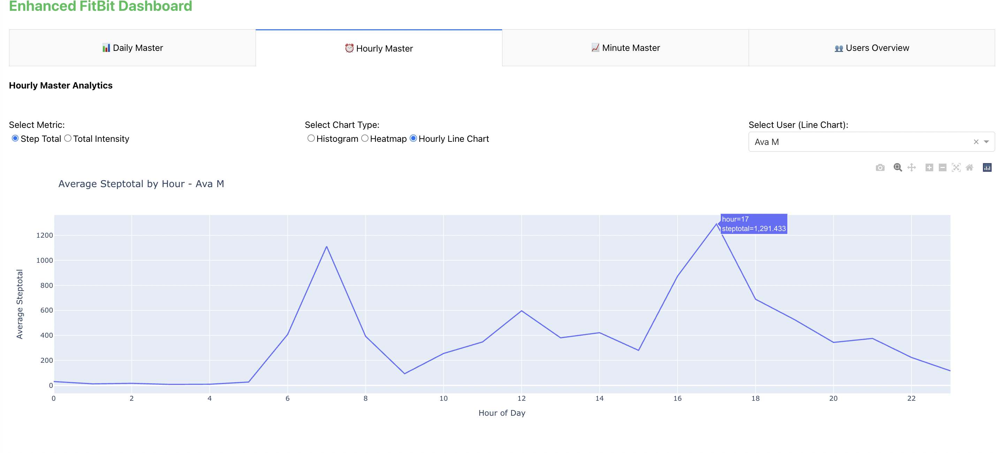

1️⃣ **Density Chart**
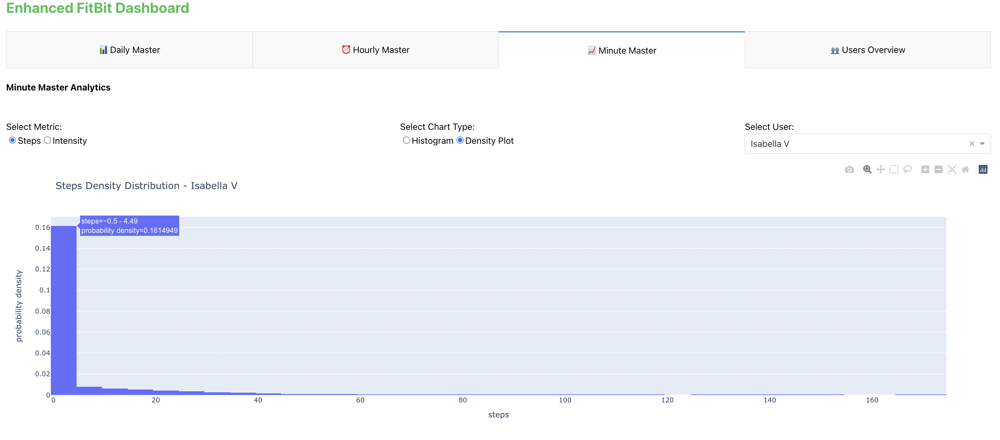

## Summary
This project was a strong test of my skills and helped push me forward as a data analyst by deepening my SQL and Python proficiency. It was structured into three main sections: Cleaning, Analysis, and Visualization.

### 🔧 Cleaning
I began with a messy FitBit dataset containing 29 CSV files. Many had inconsistencies or sparse data, so I selected a core subset with similar granularity and fuller user tracking. I then organized these into three cleaned and consolidated “master” tables: daily_master, hourly_master, and minute_master. These tables served as the foundation for my SQL analysis and Python visualizations.

### 🔍 Analysis
Using PostgreSQL, I went through nine questions ranging from basic aggregations to more complex logic. A personal favorite was calculating each user’s longest consecutive streak of “very active minutes” (over 30 minutes per day). Out of 33 users tracked over two months:

- Only one user maintained this streak for 18 days straight

- Four others sustained it for 7–10 days

- Most users managed 1–5 days

This insight painted a fascinating picture of behavior clusters — perhaps reflecting different fitness levels, such as casual users vs. serious athletes.

### 📊 Visualization
I built my first interactive Plotly dashboard, complete with user controls and tabbed views for the Daily, Hourly, Minute, and User Overview tables. Each tab featured dynamic visualizations such as:

- Histograms and time series

- Box plots and density plots

- Heatmaps and radial charts

While not every visual yielded deep insight, the process taught me a lot about turning raw data into meaningful user interfaces and visual storytelling.

In the end, this project challenged me in the right ways. I walked away with improved skills in:

- Cleaning and joining real-world datasets

- Writing advanced SQL queries (with CTEs and aggregation logic)

- Creating professional, interactive dashboards in Plotly Dash

It was a rewarding experience that helped solidify my growth as a data analyst.